<a href="https://colab.research.google.com/github/raditya12/PCVK_Ganjil2026/blob/master/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Markdown

# Semua gambar diambil dari folder PCVK di Google Drive.
DATA_DIR = Path('/content/gdrive/MyDrive/PCVK')
if not DATA_DIR.is_dir():
    raise FileNotFoundError(f'Folder gambar tidak ditemukan: {DATA_DIR}')
INTERACTIVE = True  # False: gunakan parameter contoh tanpa input().

def read_image(name, gray=False):
    path = DATA_DIR / name
    image = cv.imread(str(path), cv.IMREAD_GRAYSCALE if gray else cv.IMREAD_COLOR)
    if image is None:
        raise FileNotFoundError(f'Citra tidak dapat dibaca: {path}. Periksa DATA_DIR.')
    return image

def uint8(image):
    return np.clip(np.rint(image), 0, 255).astype(np.uint8)

def ask_number(prompt, default, valid=lambda x: True):
    if not INTERACTIVE:
        return default
    while True:
        try:
            value = float(input(f'{prompt} [default {default}]: ') or default)
            if np.isfinite(value) and valid(value):
                return value
        except ValueError:
            pass
        print('Masukan tidak valid; gunakan angka dalam rentang yang diminta.')

def show_results(images, titles, columns=2):
    rows = (len(images) + columns - 1) // columns
    fig, axes = plt.subplots(rows, columns, figsize=(5 * columns, 4 * rows), squeeze=False)
    for ax, image, title in zip(axes.flat, images, titles):
        ax.imshow(image if image.ndim == 2 else cv.cvtColor(image, cv.COLOR_BGR2RGB),
                  cmap='gray', vmin=0, vmax=255)
        ax.set_title(title)
    for ax in axes.flat:
        ax.axis('off')
    fig.tight_layout()
    plt.show()
    plt.close(fig)

def gamma_correction(image, gamma):
    if not np.isfinite(gamma) or gamma <= 0:
        raise ValueError('Gamma harus positif dan finite.')
    return uint8(255 * (image.astype(np.float64) / 255) ** (1 / gamma))

print('Dataset:', DATA_DIR.resolve())

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Dataset: /content/gdrive/MyDrive/PCVK


# **TRANSFORMASI LINIER BRIGHTNESS**

 Mengubah tingkat kecerahan citra 
-----------------------------
Kecerahan (-255 sampai 255) [default 30]: 30


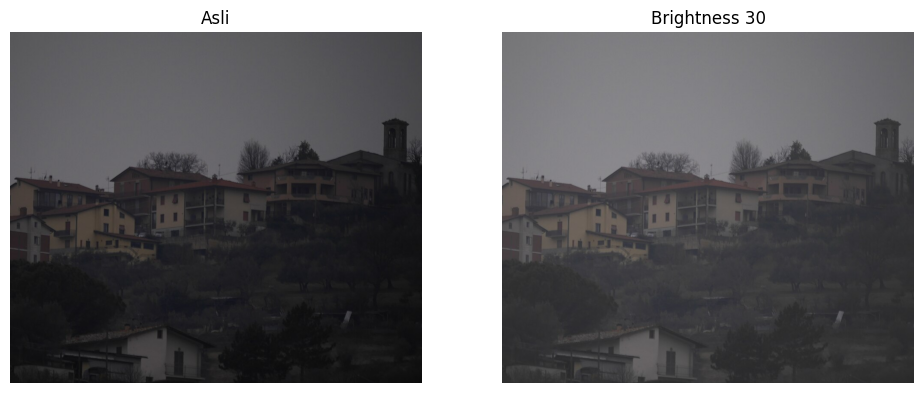

In [ ]:
import cv2 as cv
import numpy as np
# Visualisasi memakai matplotlib agar kompatibel dengan Colab dan lokal.


print(' Mengubah tingkat kecerahan citra ')
print('-----------------------------')

brightness = int(ask_number('Kecerahan (-255 sampai 255)', 30, lambda x: x.is_integer() and -255 <= x <= 255))

#sesuaikan dengan file dan folder di drive Anda
original = read_image('houses.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
#np.clip digunakan untuk melakukan truncate pixel (nilai dibatasi antara 0-255)
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y, x, c] = np.clip(
                int(original[y, x, c]) + brightness, 0, 255
            )

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
show_results([original, brightness_image], ['Asli', f'Brightness {brightness}'])

# **TUGAS PRAKTIKUM**

In [ ]:
# Persiapan tugas 1–7
peppers = read_image('peppers.jpg')
houses = read_image('houses.jpg')
print('Ukuran peppers:', peppers.shape, '| houses:', houses.shape)

Ukuran peppers: (498, 626, 3) | houses: (820, 960, 3)


## 1. Inverse citra
Rumus: $g = 255-f$. Setiap kanal dibalik; merah menjadi sian dan latar putih menjadi hitam. Inverse dua kali mengembalikan citra asli.

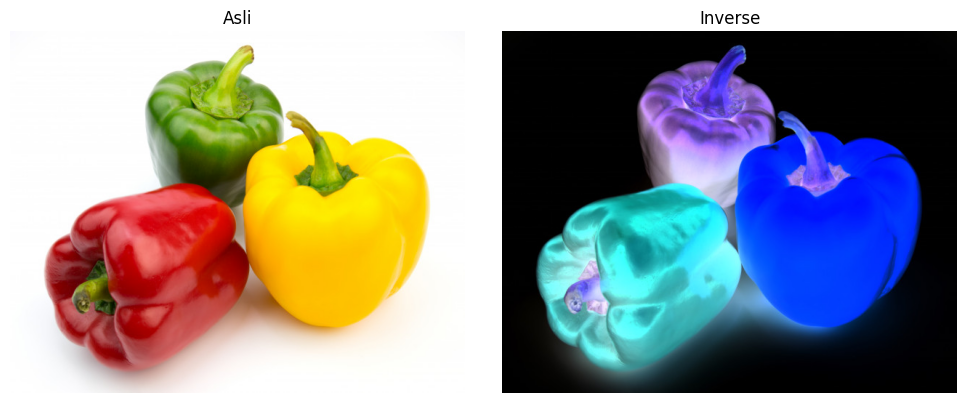

In [ ]:
inverse_image = 255 - peppers
show_results([peppers, inverse_image], ['Asli', 'Inverse'])

## 2. Transformasi contrast
Gunakan $g=af+b$ dengan contoh $a=1.5$, $b=10$. Sebagai pembanding, faktor kontras $F=259(C+255)/(255(259-C))$ bekerja terhadap titik tengah 128. Hitung dalam float sebelum clipping agar tidak overflow. Kontras berlebihan dapat menghilangkan detail highlight dan bayangan.

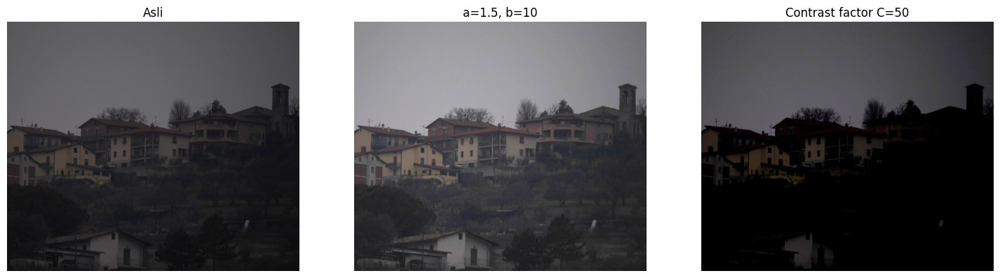

In [ ]:
alpha, beta, contrast = 1.5, 10, 50
contrast_linear = uint8(alpha * houses.astype(np.float64) + beta)
factor = 259 * (contrast + 255) / (255 * (259 - contrast))
contrast_factor = uint8(factor * (houses.astype(np.float64) - 128) + 128)
show_results([houses, contrast_linear, contrast_factor],
             ['Asli', 'a=1.5, b=10', 'Contrast factor C=50'], 3)

## 3. Logarithmic brightness
Rumus $s=c\ln(1+r)$ dengan $c=255/\ln(256)$ menormalkan intensitas 0–255. Intensitas rendah diperlebar sehingga detail gelap lebih terlihat, tetapi rentang terang dipadatkan. Transformasi log yang sudah dikuantisasi ke uint8 juga tidak selalu dapat dibalik sempurna.

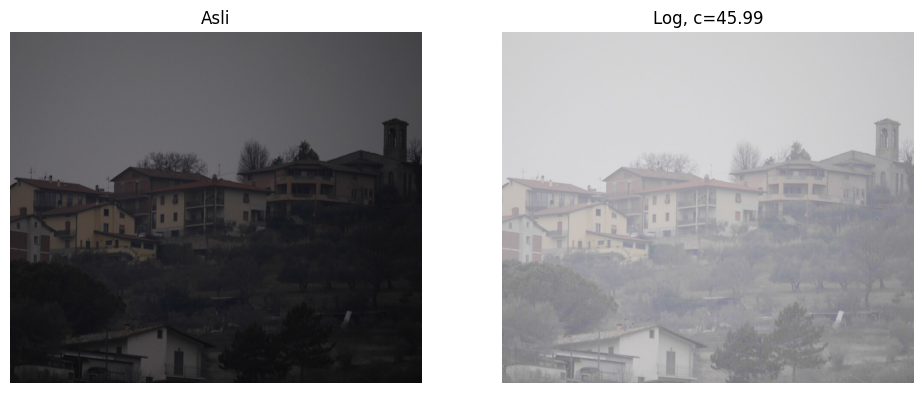

In [ ]:
c_log = 255 / np.log1p(255)
log_image = uint8(c_log * np.log1p(houses.astype(np.float64)))
show_results([houses, log_image], ['Asli', f'Log, c={c_log:.2f}'])

## 4. Grayscale: averaging, lightness, luminance
Averaging: $(R+G+B)/3$; lightness: $(\max(R,G,B)+\min(R,G,B))/2$; luminance modul: $0.21R+0.72G+0.07B$. OpenCV membaca BGR, sehingga kanal harus dibongkar dalam urutan B, G, R. Bobot hijau terbesar pada luminance membuat bagian hijau/kuning relatif terang.

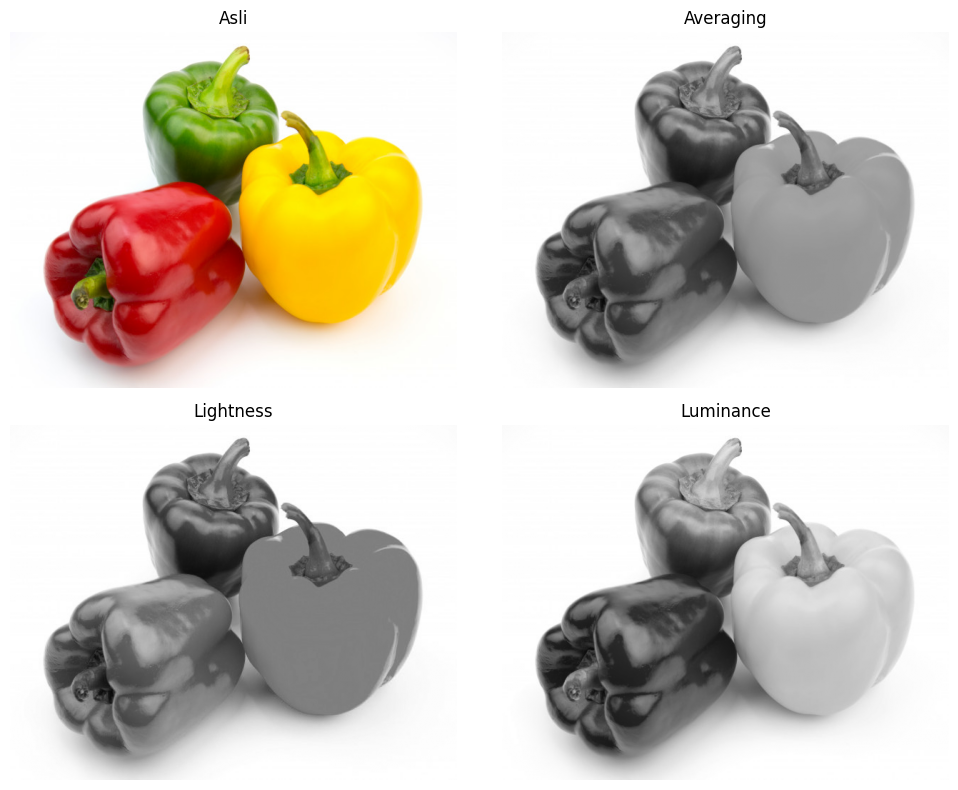

In [ ]:
pixels = peppers.astype(np.float64)
blue, green, red = cv.split(pixels)
gray_average = uint8(pixels.mean(axis=2))
gray_lightness = uint8((pixels.max(axis=2) + pixels.min(axis=2)) / 2)
gray_luminance = uint8(0.21 * red + 0.72 * green + 0.07 * blue)
show_results([peppers, gray_average, gray_lightness, gray_luminance],
             ['Asli', 'Averaging', 'Lightness', 'Luminance'])

## 5. Mempertahankan warna merah
Piksel lain diganti grayscale luminance hasil tugas 4. Seleksi merah cukup membandingkan kanal: merah dianggap dominan jika kanal R lebih besar 20 daripada kanal G dan B. Ambang 20 menghindari piksel putih/abu-abu (ketiga kanal hampir sama besar) ikut terpilih. Merah yang sangat gelap atau pucat dapat terlewat.

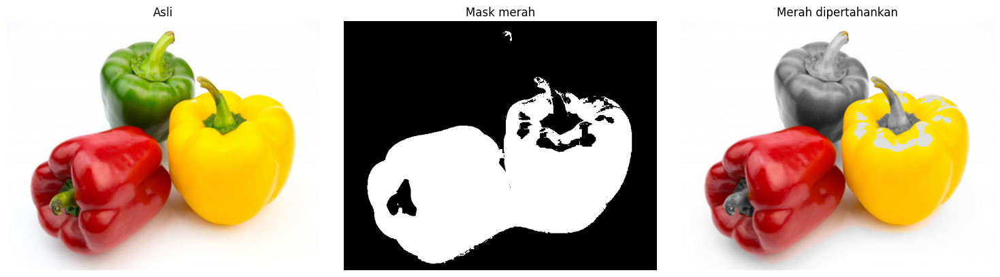

In [ ]:
blue, green, red = cv.split(peppers.astype(np.int16))
red_mask = ((red > green + 20) & (red > blue + 20)).astype(np.uint8 * 255
selective_image = cv.cvtColor(gray_luminance, cv.COLOR_GRAY2BGR)
selective_image[red_mask > 0] = peppers[red_mask > 0]
show_results([peppers, red_mask, selective_image], ['Asli', 'Mask merah', 'Merah dipertahankan'], 3)

## 6. Gamma correction dengan input pengguna
Mengikuti rumus koreksi pada halaman 6: $I'=255(I/255)^{1/\gamma}$. Gamma >1 mencerahkan, 0<gamma<1 menggelapkan, dan gamma=1 identitas. Label contoh pada halaman 18 tidak konsisten; implementasi mengikuti rumus ini. Input menerima pecahan dan menolak nol, negatif, NaN, serta infinity.

Masukkan Gamma (>0) [default 3.0]: 0.5


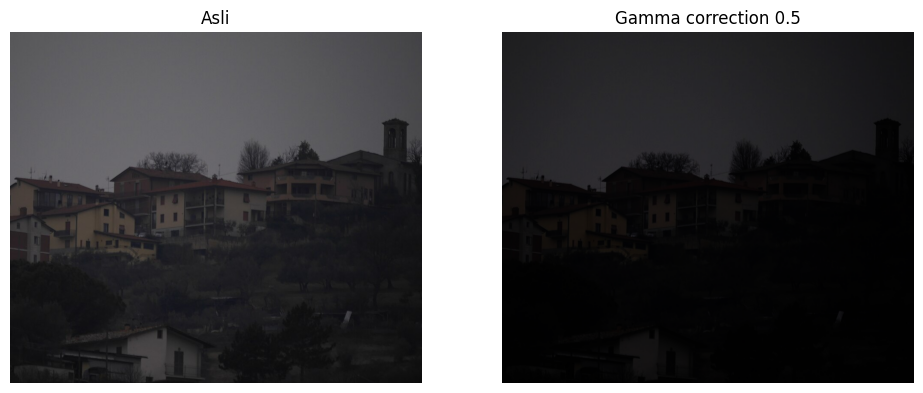

In [ ]:
gamma = ask_number('Masukkan Gamma (>0)', 3.0, lambda x: x > 0)
gamma_image = gamma_correction(houses, gamma)
show_results([houses, gamma_image], ['Asli', f'Gamma correction {gamma:g}'])

## 7. Simulasi image depth
Dengan $level=255/(2^b-1)$, kuantisasi yang benar adalah $C'=\operatorname{round}(C/level)\times level$, kemudian pembulatan untuk penyimpanan uint8. Pembulatan harus dilakukan **sebelum** mengalikan kembali; jika hanya membulatkan $(C/level)level$, citra tidak terkuantisasi. Simulasi tetap disimpan 8-bit, tetapi memiliki maksimal $2^b$ intensitas.

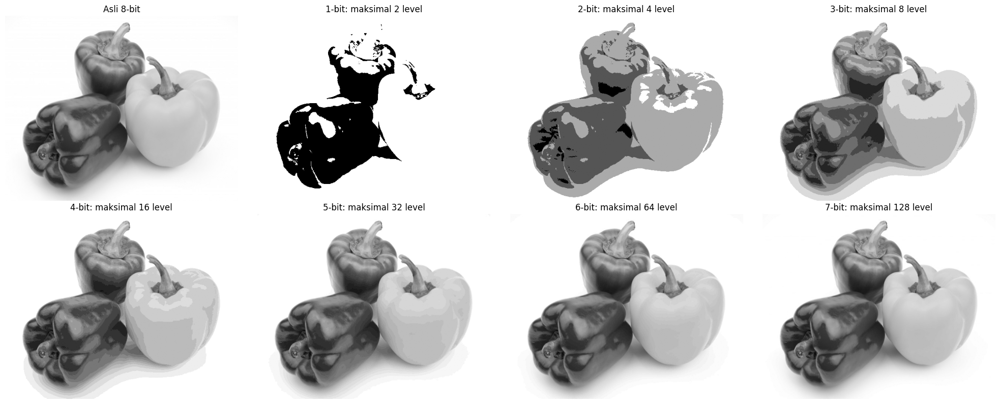

1-bit: 2 intensitas aktual
2-bit: 4 intensitas aktual
3-bit: 8 intensitas aktual
4-bit: 16 intensitas aktual
5-bit: 31 intensitas aktual
6-bit: 63 intensitas aktual
7-bit: 125 intensitas aktual


In [ ]:
def image_depth(image, bits):
    if not isinstance(bits, (int, np.integer)) or not 1 <= bits <= 8:
        raise ValueError('Bit depth harus integer 1–8.')
    level = 255 / (2 ** bits - 1)
    return uint8(np.rint(image.astype(np.float64) / level) * level)

gray_depth = read_image('peppers.jpg', gray=True)
depth_images = [image_depth(gray_depth, bits) for bits in range(1, 8)]
show_results([gray_depth] + depth_images,
             ['Asli 8-bit'] + [f'{b}-bit: maksimal {2**b} level' for b in range(1, 8)], 4)
for bits, image in enumerate(depth_images, 1):
    print(f'{bits}-bit: {len(np.unique(image))} intensitas aktual')

## 8. Average denoising dan PSNR
Rata-ratakan N citra noise pertama (N = 10, 20, 40, 80, 100), lalu hitung PSNR terhadap galaxy.jpg sesuai rumus modul: $PSNR = 10\log_{10}(255^2/MSE)$. Akumulasi memakai float64 agar penjumlahan tidak overflow. MSE = 0 menghasilkan PSNR tak hingga.

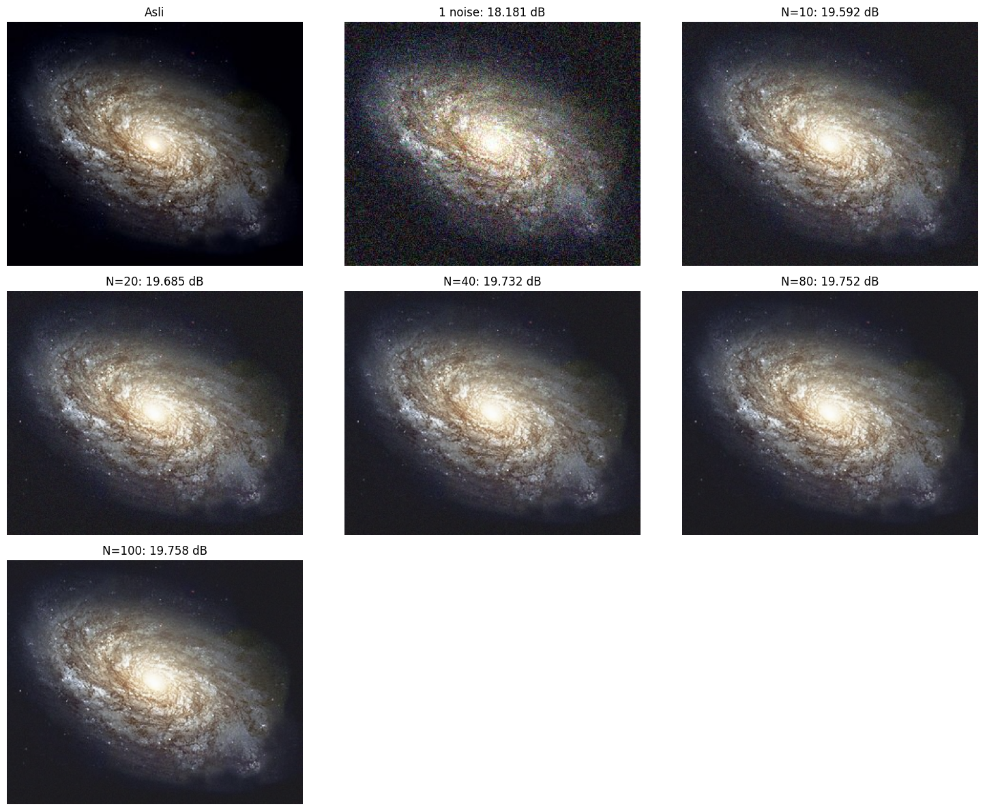

| N | PSNR (dB) | Kenaikan (dB) |
|---|---:|---:|
| 10 | 19.5919 | — |
| 20 | 19.6854 | 0.0935 |
| 40 | 19.7323 | 0.0469 |
| 80 | 19.7522 | 0.0199 |
| 100 | 19.7580 | 0.0058 |

PSNR naik ketika jumlah citra yang dirata-rata bertambah, tetapi kenaikannya semakin kecil: 10 -> 20 hanya sekitar 0.10 dB, sedangkan 80 -> 100 hanya sekitar 0.006 dB. Penambahan citra di atas 40-80 hampir tidak mengubah hasil.

In [ ]:
import glob

def psnr(reference, result):
    if reference.shape != result.shape:
        raise ValueError('Ukuran citra PSNR harus sama.')
    mse = np.mean((reference.astype(np.float64) - result.astype(np.float64)) ** 2)
    return float('inf') if mse == 0 else float(10 * np.log10(255 ** 2 / mse))

galaxy = read_image('galaxy.jpg')
noise_files = sorted(glob.glob(str(DATA_DIR / 'noises' / '*.jpg')))
if len(noise_files) < 100:
    raise ValueError(f'Diperlukan 100 citra noise asli; ditemukan {len(noise_files)}.')
counts = [10, 20, 40, 80, 100]
accumulator = np.zeros(galaxy.shape, dtype=np.float64)
denoised_images, psnr_rows = [], []
for n, path in enumerate(noise_files[:100], 1):
    noisy = cv.imread(path)
    if noisy is None or noisy.shape != galaxy.shape:
        raise ValueError(f'Citra noise rusak atau ukurannya berbeda: {path}')
    if n == 1:
        first_noisy = noisy.copy()
    accumulator += noisy
    if n in counts:
        result = uint8(accumulator / n)
        value = psnr(galaxy, result)
        gain = None if not psnr_rows else value - psnr_rows[-1][1]
        psnr_rows.append((n, value, gain))
        denoised_images.append(result)
show_results([galaxy, first_noisy] + denoised_images,
    ['Asli', f'1 noise: {psnr(galaxy, first_noisy):.3f} dB'] +
    [f'N={n}: {p:.3f} dB' for n, p, _ in psnr_rows], 3)
table = '| N | PSNR (dB) | Kenaikan (dB) |\n|---|---:|---:|\n'
for n, p, gain in psnr_rows:
    gain_text = '—' if gain is None else f'{gain:.4f}'
    table += f'| {n} | {p:.4f} | {gain_text} |\n'
conclusion = ('PSNR naik ketika jumlah citra yang dirata-rata bertambah, '
    'tetapi kenaikannya semakin kecil: 10 ->20 hanya sekitar 0.10 dB, '
    'sedangkan 80 -> 100 hanya sekitar 0.006 dB. '
    'Penambahan citra di atas 40-80 hampir tidak mengubah hasil.')
display(Markdown(table + '\n' + conclusion))

## 9. Image masking dan operator logika
Dua lingkaran memilih bagian atas kedua orang. Mask bernilai 255 di dalam dan 0 di luar. Untuk latar **putih** sesuai modul, gabungkan `(A AND M) OR NOT(M)`; AND saja menghasilkan latar hitam. Posisi lingkaran dinyatakan sebagai proporsi ukuran citra dan dapat disesuaikan.

| Operasi | Di dalam mask | Di luar mask |
|---|---|---|
| NOT(A) | 255-A | 255-A |
| A OR M | Putih (255) | A asli |
| A AND M | A asli | Hitam (0) |
| NOT(A AND M), NAND | 255-A | Putih (255) |
| A XOR M | 255-A | A asli |

NOT adalah operator unary pada A; operator lain menggunakan A dan mask tiga kanal. NAND berbeda dari A AND NOT(M).

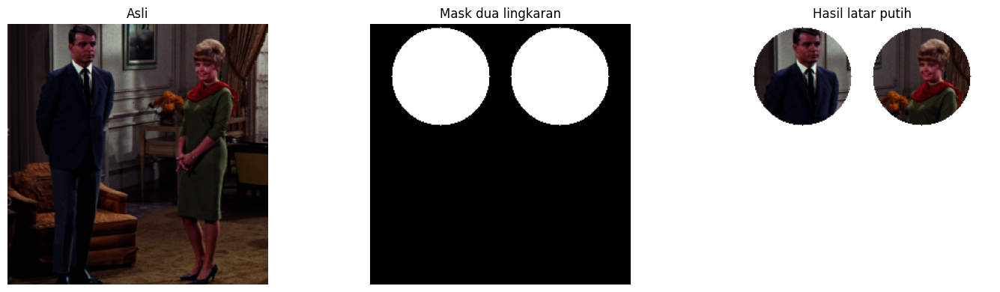

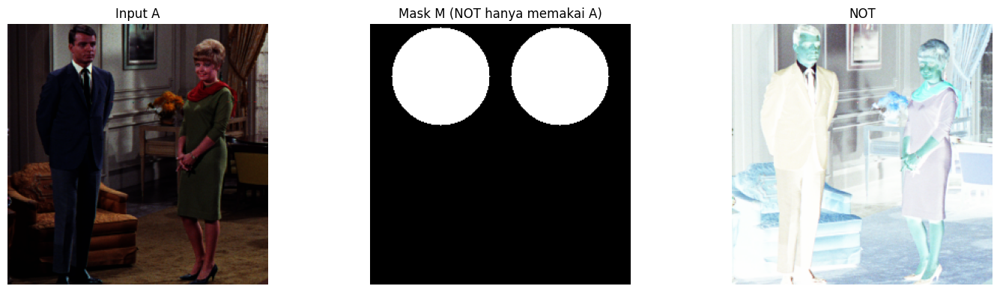

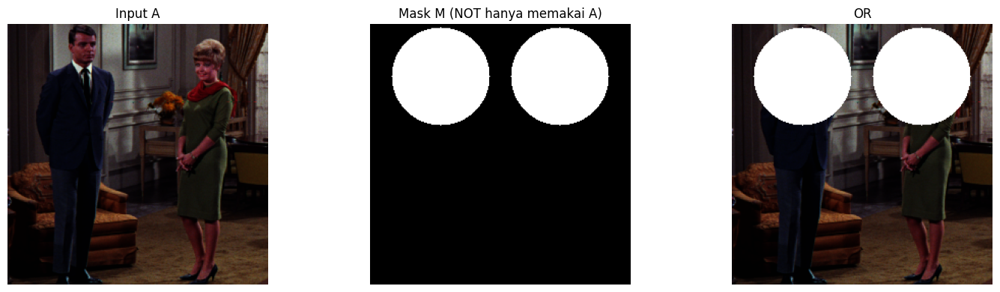

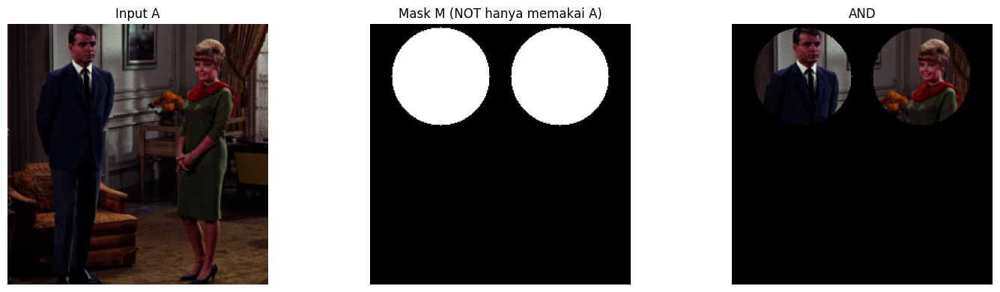

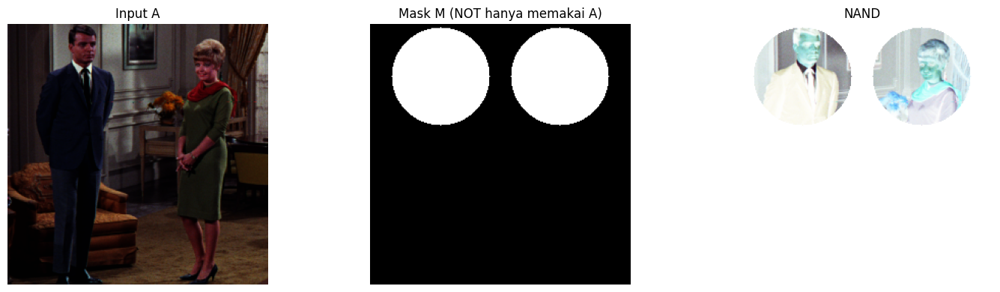

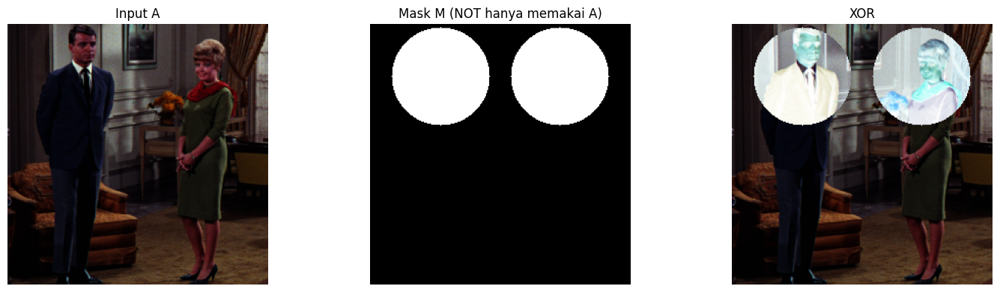

In [ ]:
couple = read_image('couple.tiff')
height, width = couple.shape[:2]
mask = np.zeros((height, width), dtype=np.uint8)
radius = int(0.19 * min(height, width))
for cx in (0.27, 0.73):
    cv.circle(mask, (int(cx * width), int(0.20 * height)), radius, 255, -1)
mask_bgr = cv.cvtColor(mask, cv.COLOR_GRAY2BGR)
and_image = cv.bitwise_and(couple, mask_bgr)
white_background = cv.bitwise_or(and_image, cv.bitwise_not(mask_bgr))
show_results([couple, mask, white_background], ['Asli', 'Mask dua lingkaran', 'Hasil latar putih'], 3)
operators = {'NOT': cv.bitwise_not(couple), 'OR': cv.bitwise_or(couple, mask_bgr),
             'AND': and_image, 'NAND': cv.bitwise_not(and_image),
             'XOR': cv.bitwise_xor(couple, mask_bgr)}
for name, result in operators.items():
    show_results([couple, mask, result],r
                 ['Input A', 'Mask M (NOT hanya memakai A)', name], 3)

## 10. Perbaikan foto malam hari
Letakkan **foto malam asli** `night.jpg` di folder `PCVK` pada Google Drive (ubah sumber jika memakai foto sendiri). Metode: **gamma correction** dengan gamma 2.2, dibandingkan 1.5 dan 3.0. Gamma >1 mencerahkan intensitas rendah dan menengah tanpa menambahkan konstanta pada semua piksel; hitam 0 dan putih 255 tetap. Risikonya: noise dan artefak kompresi ikut terlihat, warna dapat berubah, dan hasil terlalu terang jika gamma berlebihan. Detail yang hilang saat pemotretan tidak dapat diciptakan kembali.


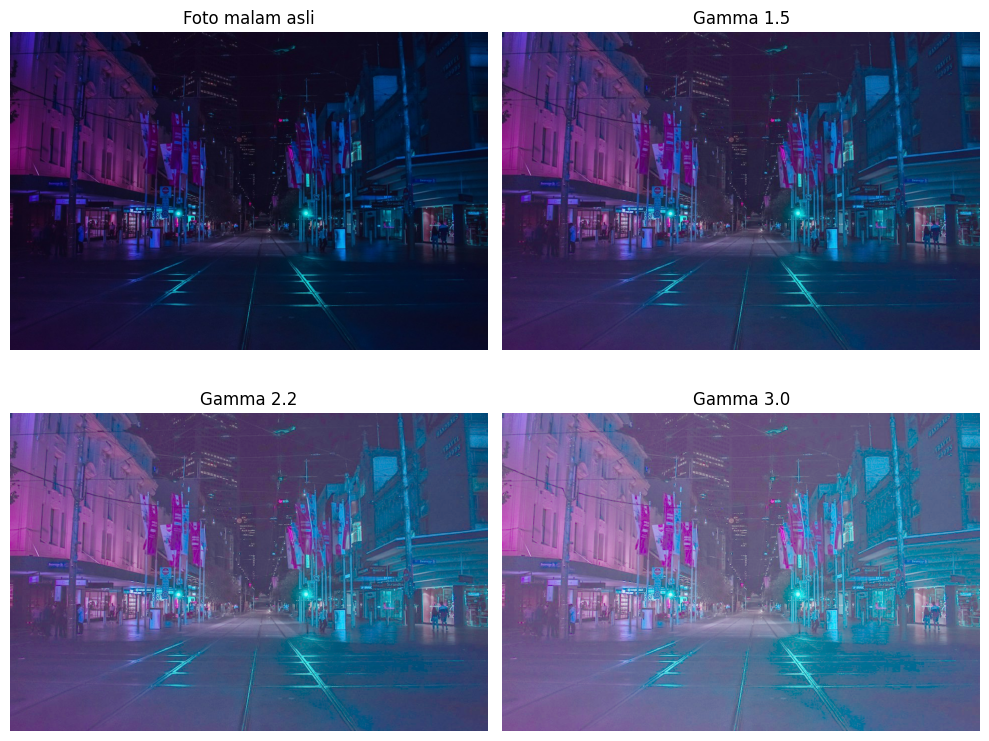

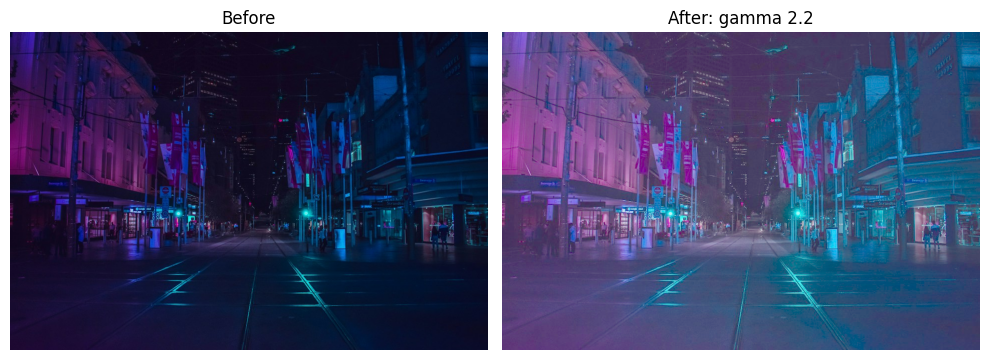

In [ ]:
night = read_image('night.jpg')
night_gamma = 2.2
night_result = gamma_correction(night, night_gamma)
show_results([night] + [gamma_correction(night, g) for g in (1.5, 2.2, 3.0)],
             ['Foto malam asli', 'Gamma 1.5', 'Gamma 2.2', 'Gamma 3.0'])
show_results([night, night_result], ['Before', f'After: gamma {night_gamma}'])


## 11. Perbaikan crayfish.jpg
Citra tampak berkontras rendah, jadi gunakan **transformasi contrast** $g = a\cdot f + b$ dari tugas 2. Coba beberapa pasangan nilai $(a, b)$, bandingkan hasilnya, lalu pilih yang paling jelas memisahkan crayfish dari latarnya tanpa membuat banyak piksel menjadi 0 atau 255 (clipping). Sebagai alternatif pembanding, gamma correction juga dapat dicoba seperti pada tugas 6.


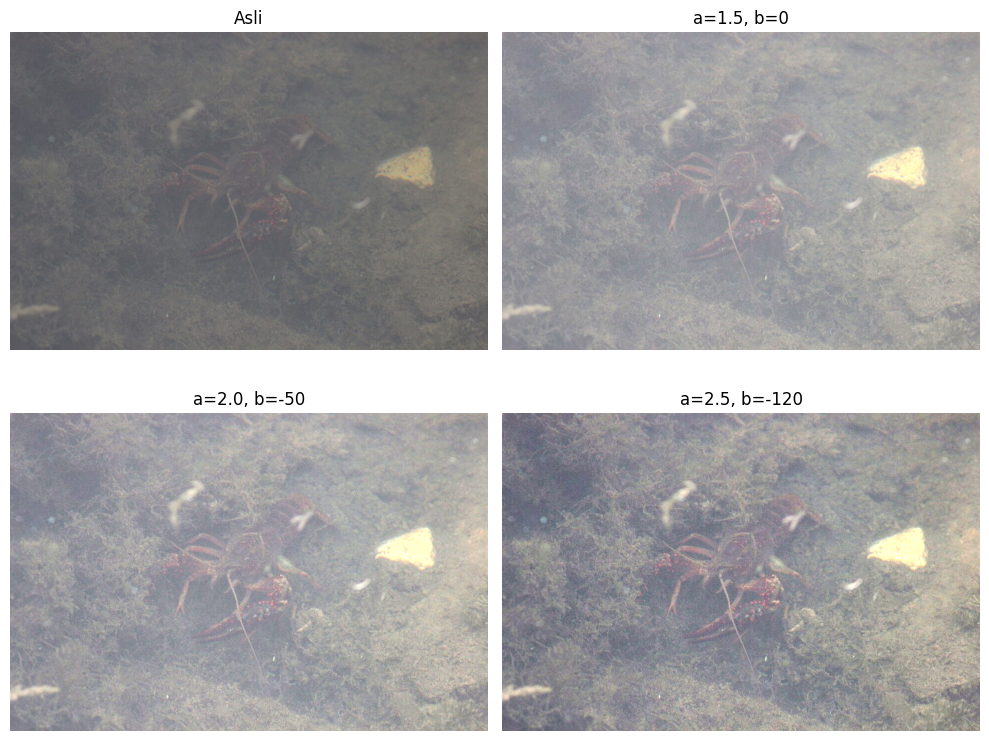

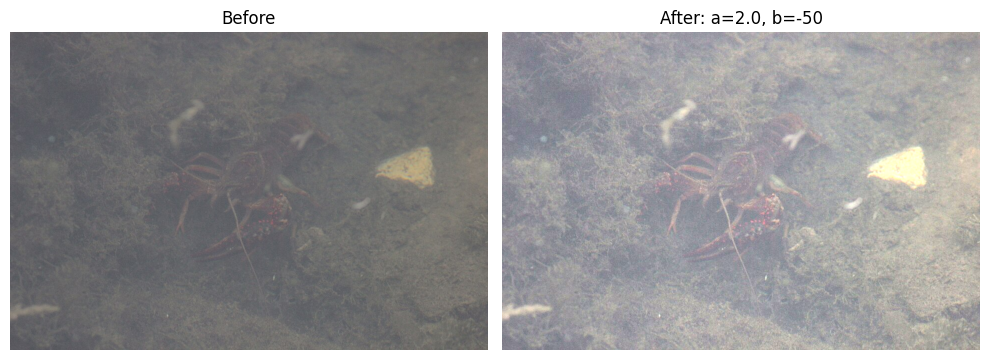

In [ ]:
crayfish = read_image('crayfish.jpg')
# Percobaan contrast g = a*f + b; hitung dalam float agar tidak overflow.
trials = [(1.5, 0), (2.0, -50), (2.5, -120)]
contrast_images = [uint8(a * crayfish.astype(np.float64) + b) for a, b in trials]
show_results([crayfish] + contrast_images,
             ['Asli'] + [f'a={a}, b={b}' for a, b in trials], 2)

# Pilihan a dan b terbaik ditentukan setelah membandingkan hasil di atas.
a_best, b_best = 2.0, -50
crayfish_result = uint8(a_best * crayfish.astype(np.float64) + b_best)
show_results([crayfish, crayfish_result], ['Before', f'After: a={a_best}, b={b_best}'])
